In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [2]:
run_id = ''
train_epochs = 6
start_epoch = 0
dataset_size = 100000
lr = 1e-4
decay_rate = 0
decay_steps = 1
style_loss_weight = 50
tv_weight = 0
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=125, test_steps=125)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 14650850.0000 - val_loss: 7420940.0000
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 5449275.5000 - val_loss: 4736502.0000
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 4521042.5000 - val_loss: 3816951.2500
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 3964616.0000 - val_loss: 7211161.0000
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 4207079.0000 - val_loss: 3751779.0000
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 4338992.5000 - val_loss: 2963309.5000
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 4389142.5000 - val_loss: 3999131.7500
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 4486681.0000 - val_loss: 5062041.0000
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 5035334.5000 - val_loss: 4582631.5000
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - lo

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 528s 528ms/step - loss: 3187168.0000 - val_loss: 3123188.7500
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 529s 529ms/step - loss: 3406981.2500 - val_loss: 3503320.2500
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 4692995.5000 - val_loss: 4270562.0000
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 3372540.2500 - val_loss: 3730292.2500
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 3070320.5000 - val_loss: 3413531.2500
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 3428984.0000 - val_loss: 3985076.2500
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 535ms/step - loss: 3180184.2500 - val_loss: 3438924.5000
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 3167053.5000 - val_loss: 2740046.2500
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 2922183.5000 - val_loss: 2913651.7500
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/s

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 530s 530ms/step - loss: 2733763.7500 - val_loss: 4559657.0000
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 528s 528ms/step - loss: 2671380.2500 - val_loss: 2377681.5000
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 532s 532ms/step - loss: 3756473.7500 - val_loss: 2599050.0000
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2653363.2500 - val_loss: 2235183.7500
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 2618187.5000 - val_loss: 2551310.7500
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 545ms/step - loss: 2701527.5000 - val_loss: 3897082.2500
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 3111744.5000 - val_loss: 2448940.0000
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 3116827.7500 - val_loss: 3279307.5000
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 2670735.7500 - val_loss: 2951046.5000
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/s

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 529s 530ms/step - loss: 2771882.5000 - val_loss: 2503357.0000
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 527s 527ms/step - loss: 2452336.7500 - val_loss: 2011747.3750
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 4471122.5000 - val_loss: 2810753.5000
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 533s 534ms/step - loss: 2730417.2500 - val_loss: 2508438.0000
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 533s 533ms/step - loss: 3185526.0000 - val_loss: 2606955.5000
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 3013711.0000 - val_loss: 2377752.7500
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 2506441.5000 - val_loss: 2394496.5000
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 2536120.5000 - val_loss: 2666354.7500
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 2382183.0000 - val_loss: 2923008.2500
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/s

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 532s 532ms/step - loss: 2470601.5000 - val_loss: 2630946.0000
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 531s 531ms/step - loss: 2496636.5000 - val_loss: 3528794.5000
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 2272397.0000 - val_loss: 3093476.2500
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 3254930.7500 - val_loss: 3539956.0000
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 2525953.0000 - val_loss: 2359027.0000
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 3591072.7500 - val_loss: 2038509.8750
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 2929175.2500 - val_loss: 3249009.7500
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 2752970.7500 - val_loss: 2453921.0000
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 2346352.2500 - val_loss: 1842543.2500
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/s

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 532s 532ms/step - loss: 2942509.0000 - val_loss: 2660262.5000
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 531s 532ms/step - loss: 2388298.0000 - val_loss: 2256535.0000
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 2144399.2500 - val_loss: 2168633.5000
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 2253512.0000 - val_loss: 2870926.7500
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 3139952.2500 - val_loss: 3674619.0000
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 3671644.5000 - val_loss: 2248528.7500
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 3702587.2500 - val_loss: 2542131.2500
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 3022914.2500 - val_loss: 2327681.2500
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 2304891.0000 - val_loss: 3010280.2500
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/s

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

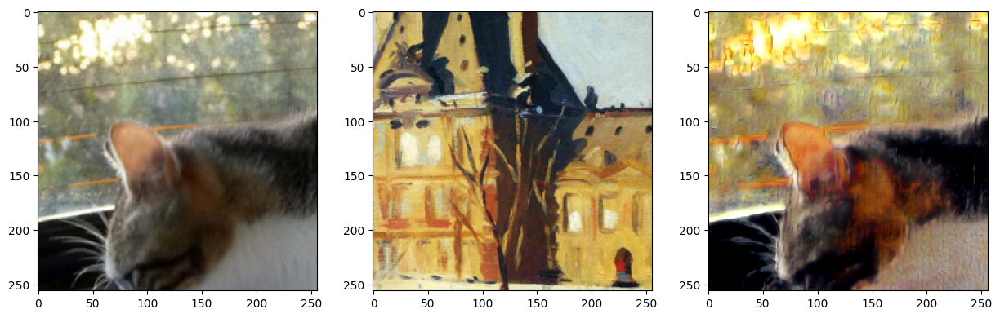

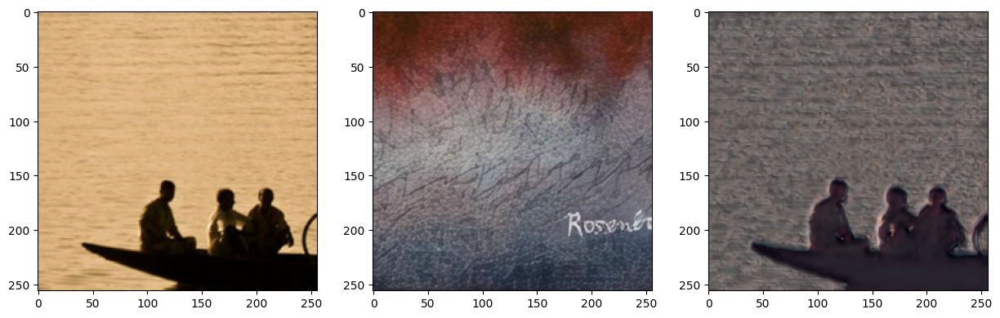

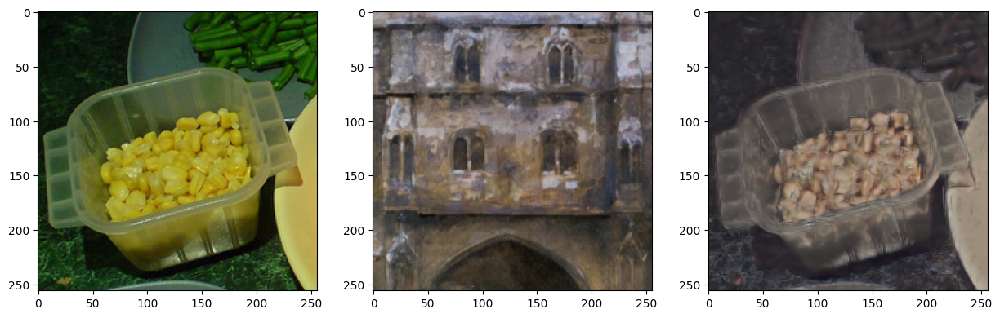

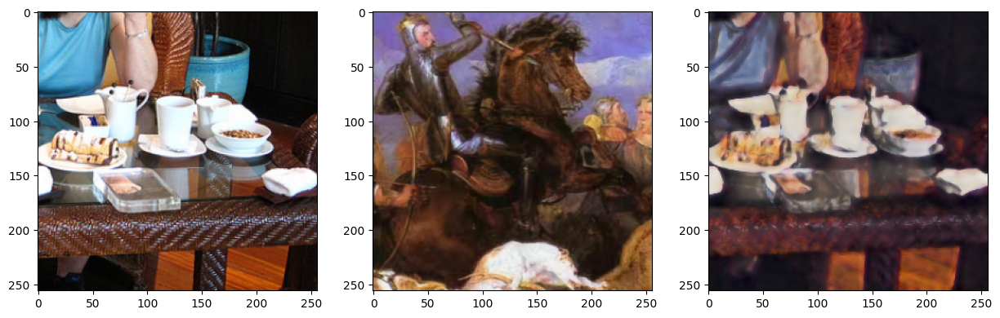

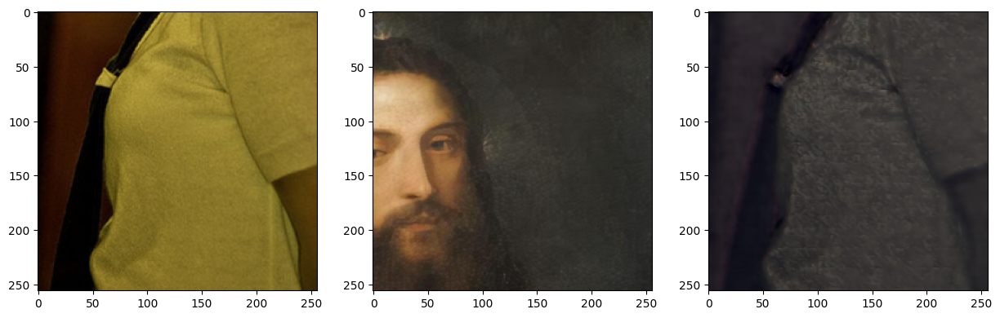

...

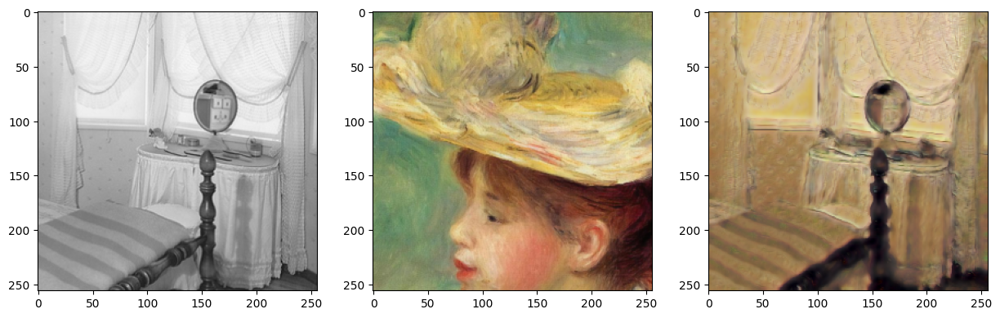

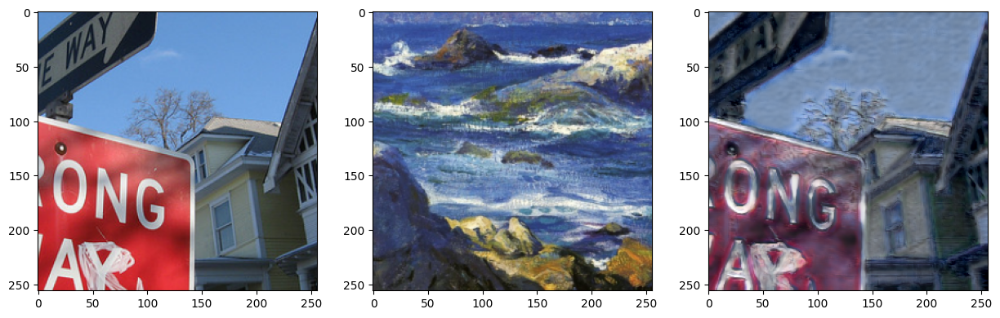

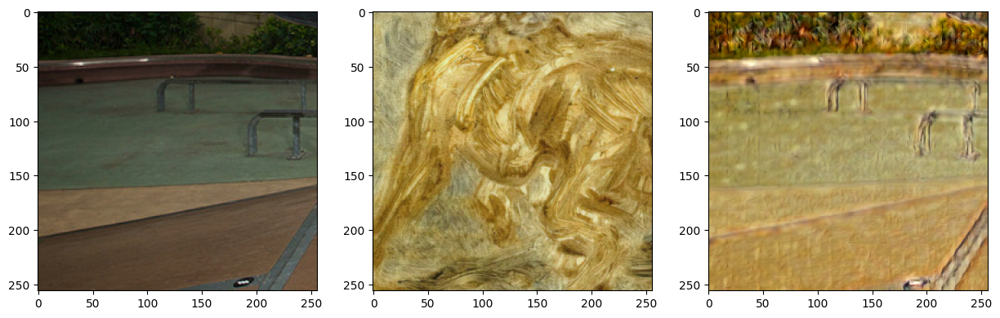

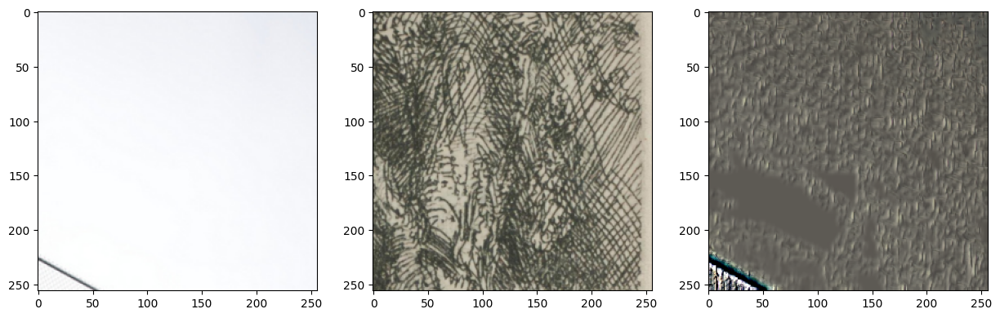

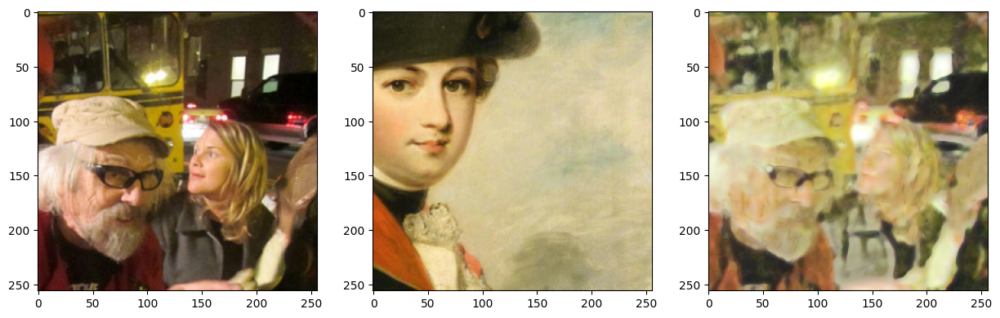

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')
city = Path('D:/StyleTransferAI/StyleTransferAI/test_images/city.jpg')
oil_paint = Path('D:/StyleTransferAI/StyleTransferAI/test_images/oil_paint.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

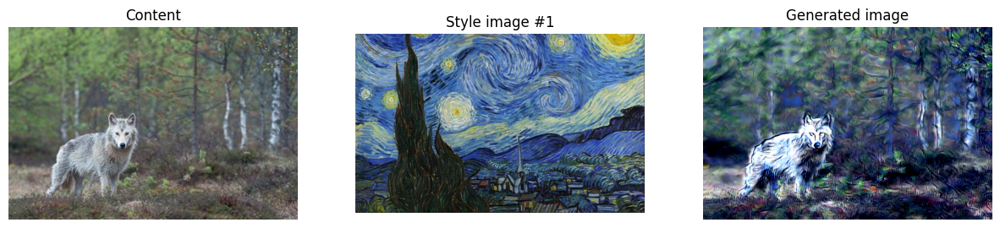

In [8]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=1500)

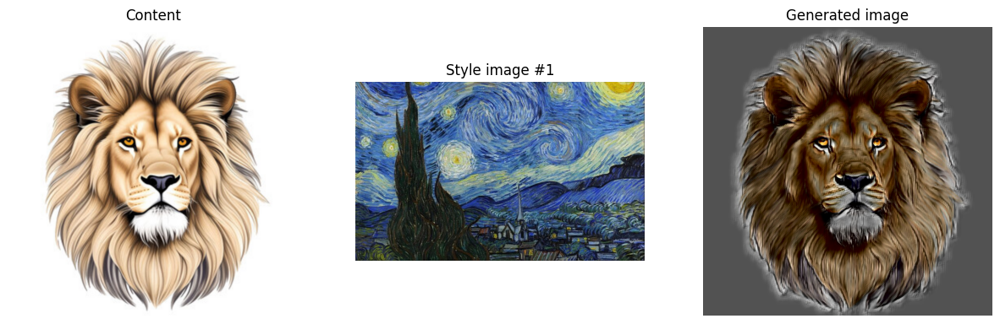

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

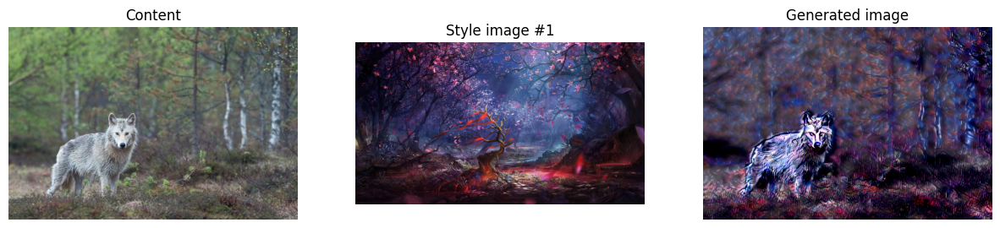

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

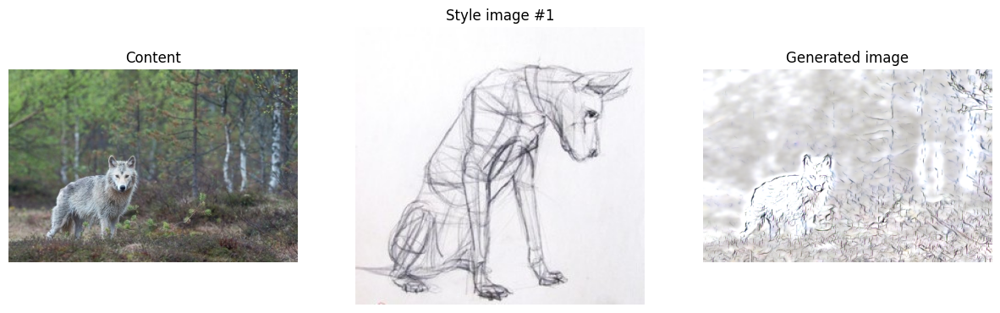

In [11]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

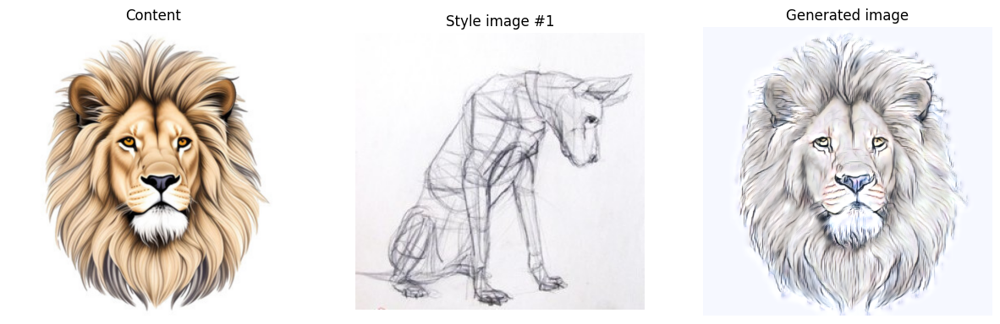

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)

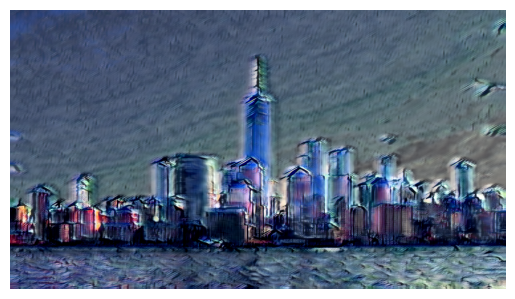

In [13]:
model.generate(city, van_gogh, show_img=True)

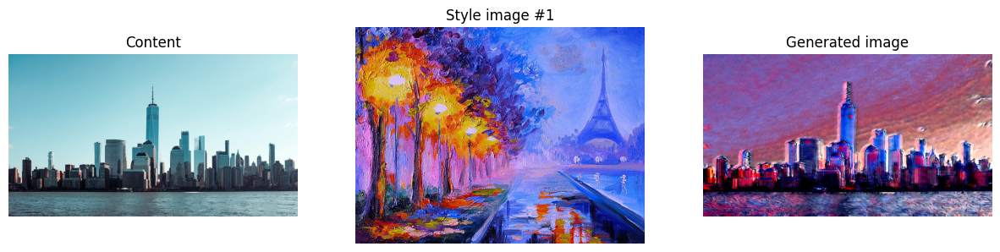

In [14]:
model.generate(city, oil_paint, show_img=True, show_inputs=True, resize_size=2000)